In [6]:
import scipy.ndimage as ndimage
import metpy.calc as mpcalc
from metpy.units import units
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import datetime
import numpy as np
import sys
import os
import xarray as xr

# import custom modules
import pull_rap_data
import map_data_features as mdf


# add additional directory filepaths to the OS path to access & import other custom modules
obs_path = os.path.abspath("../observations-data")
misc_path = os.path.abspath("../misc")

paths = [obs_path, misc_path]
for path in paths:
    if path not in sys.path:
        sys.path.append(path)

from get_metars import get_metar_data
from get_goes_from_aws import download_goes_file
from get_radar_mosaic import get_latest_mosaic
from get_wpc_bulletin import plot_bulletin
from colormaps import *

## Pull RAP data and Extract basic variables

In [7]:
data_type = 'Analysis'

raw_data = pull_rap_data.analysis(box_size=35)

# LATS & LONS
lats = raw_data.variables['lat'][:]
lons = raw_data.variables['lon'][:]

# PRES LEVS
pres_levs = raw_data['isobaric'][:]
pres_levs = pres_levs / 100

# DATE INFO
try:
    data_date = raw_data['time'].values[0]
except: 
    data_date = raw_data['time1'].values[0]
    pass
valid_date = f'{data_date}'


# BASIC DATA EXTRACTION
ghgt_iso = ndimage.gaussian_filter(raw_data.variables['Geopotential_height_isobaric'][0], sigma=0.75)
temp_iso = ndimage.gaussian_filter(raw_data.variables['Temperature_isobaric'][0], sigma=0.75) - 273.15 
uwnd_iso = ndimage.gaussian_filter(raw_data.variables['u-component_of_wind_isobaric'][0], sigma=0.75) * 1.94384 
vwnd_iso = ndimage.gaussian_filter(raw_data.variables['v-component_of_wind_isobaric'][0], sigma=0.75) * 1.94384 

pres_sfc = ndimage.gaussian_filter(raw_data.variables['MSLP_MAPS_System_Reduction_msl'][0], sigma=0.75)
temp_sfc = ndimage.gaussian_filter(raw_data.variables['Temperature_height_above_ground'][0], sigma=0.75) - 273.15
uwnd_sfc = ndimage.gaussian_filter(raw_data.variables['u-component_of_wind_height_above_ground'][0], sigma=0.75) * 1.94384
vwnd_sfc = ndimage.gaussian_filter(raw_data.variables['v-component_of_wind_height_above_ground'][0], sigma=0.75) * 1.94384
relh_sfc = ndimage.gaussian_filter(raw_data.variables['Relative_humidity_height_above_ground'][0], sigma=0.75)
dwpt_sfc = mpcalc.dewpoint_from_relative_humidity(temp_sfc*units.degC, relh_sfc*units.percent)


#################################
# CALCULATE FRONTOGENESIS
################################# 
# using MetPy, compute frontogensis
fgen = mpcalc.frontogenesis(raw_data['Temperature_isobaric'], 
                            raw_data['u-component_of_wind_isobaric'],
                            raw_data['v-component_of_wind_isobaric'],
                            latitude=raw_data['lon'].values,longitude=raw_data['lon'].values,crs=ccrs.PlateCarree())
# convert units to delta deg C / 100 km / 3 hr
fgen = fgen.metpy.convert_units('delta_degC/km/hour')*3*100
# create `fgen_masked`, a DataArray of fgen values >2, all else are Nan
fgen_masked = fgen.where(fgen > (2 * units('delta_degC/km/hour')))


#################################
# CALCULATE ADVECTION
################################# 
# using MetPy, compute temperature advection
adv = mpcalc.advection(raw_data['Temperature_isobaric'], 
                       raw_data['u-component_of_wind_isobaric'],
                       raw_data['v-component_of_wind_isobaric'],
                       latitude=raw_data['lon'].values,longitude=raw_data['lon'].values,crs=ccrs.PlateCarree())
# convert units to delta deg C / hr
adv = adv.metpy.convert_units('delta_degC/hour')
# apply some smoothing to adv 
adv = ndimage.gaussian_filter(adv, sigma=1, order=0) * units('K/sec')

from metpy.interpolate import interpolate_to_isosurface

# use metpy to compute theta & add it into the `rap-data` DataSet
raw_data['theta'] = mpcalc.potential_temperature(raw_data['isobaric'],raw_data['Temperature_isobaric'])

# use metpy to compute latitude / longitude grid deltas (dx, dy) for PV calculation
dx, dy = mpcalc.lat_lon_grid_deltas(raw_data['lon'].values, raw_data['lat'].values)

# use metpy to compute PV and add it into the `rap_data` DataSet
raw_data['pv'] = mpcalc.potential_vorticity_baroclinic(raw_data['theta'],
                                                        raw_data['isobaric'],
                                                        u=raw_data['u-component_of_wind_isobaric'],
                                                        v=raw_data['v-component_of_wind_isobaric'],
                                                        dx=dx[None, None, :, :], dy=dy[None, None, :, :],
                                                        latitude=raw_data['lat'])

thta_on_2pvu = interpolate_to_isosurface(raw_data['pv'].values, raw_data['theta'].values,  2*1e-6, bottom_up_search=True)
u_on_2pvu    = interpolate_to_isosurface(raw_data['pv'][:,0,:,:].values, raw_data['u-component_of_wind_isobaric'][0,:,:,:].values, 2*1e-6, bottom_up_search=True)
v_on_2pvu    = interpolate_to_isosurface(raw_data['pv'][:,0,:,:].values, raw_data['v-component_of_wind_isobaric'][0,:,:,:].values, 2*1e-6, bottom_up_search=True)

> RAP REANALYSIS DATA ACCESS FUNCTION --
-----------------------------------------
> COMPLETE --------
> RUNTIME: 00:00:21


C:\Users\kyle.gillett\OneDrive\SCRIPTS\wx-tools\.venv\Lib\site-packages\pint\facets\plain\quantity.py:1006: RuntimeWarning: invalid value encountered in divide
  magnitude = magnitude_op(new_self._magnitude, other._magnitude)
C:\Users\kyle.gillett\OneDrive\SCRIPTS\wx-tools\.venv\Lib\site-packages\pint\facets\numpy\numpy_func.py:322: RuntimeWarning: invalid value encountered in arcsin
  result_magnitude = func(*stripped_args, **stripped_kwargs)


## Define map-builder function

In [8]:
def build_map(extent=[-122, -73, 21, 56], projection=ccrs.LambertConformal(), style='light'):

    fig = plt.figure(figsize=(20, 12))
    fig.set_facecolor('#009946')
    ax = plt.axes(projection=projection)

    # apply the map extent (lat/lon bounding box)
    ax.set_extent(extent)
    # axis aspect ratio
    ax.set_box_aspect(0.7)
    # add map features
    
    if style == 'light':
        color = 'gray'
        alpha = 0.5
    else: 
        color = 'black'
        alpha = 0.8
    ax.add_feature(cfeature.STATES, edgecolor='navy', alpha=0.5, linestyle='-', linewidth=1, zorder=10)
    ax.add_feature(cfeature.LAND, facecolor=color, alpha=alpha, zorder=1)
    ax.add_feature(cfeature.OCEAN, facecolor=color, alpha=alpha+0.2, zorder=0)
    #ax.add_feature(cfeature.BORDERS, color='white', alpha=1, linestyle='-', linewidth=1, zorder=11)
    ax.add_feature(cfeature.COASTLINE, color='navy', alpha=0.5, linestyle='-', linewidth=1, zorder=11)

    # apply tight layout to the figure (keeps things tiddy)
    plt.tight_layout()

    # return the figure axis
    return fig, ax



C:\Users\kyle.gillett\OneDrive\SCRIPTS\wx-tools\.venv\Lib\site-packages\cartopy\mpl\feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


(np.float64(-0.5), np.float64(929.5), np.float64(424.5), np.float64(-0.5))

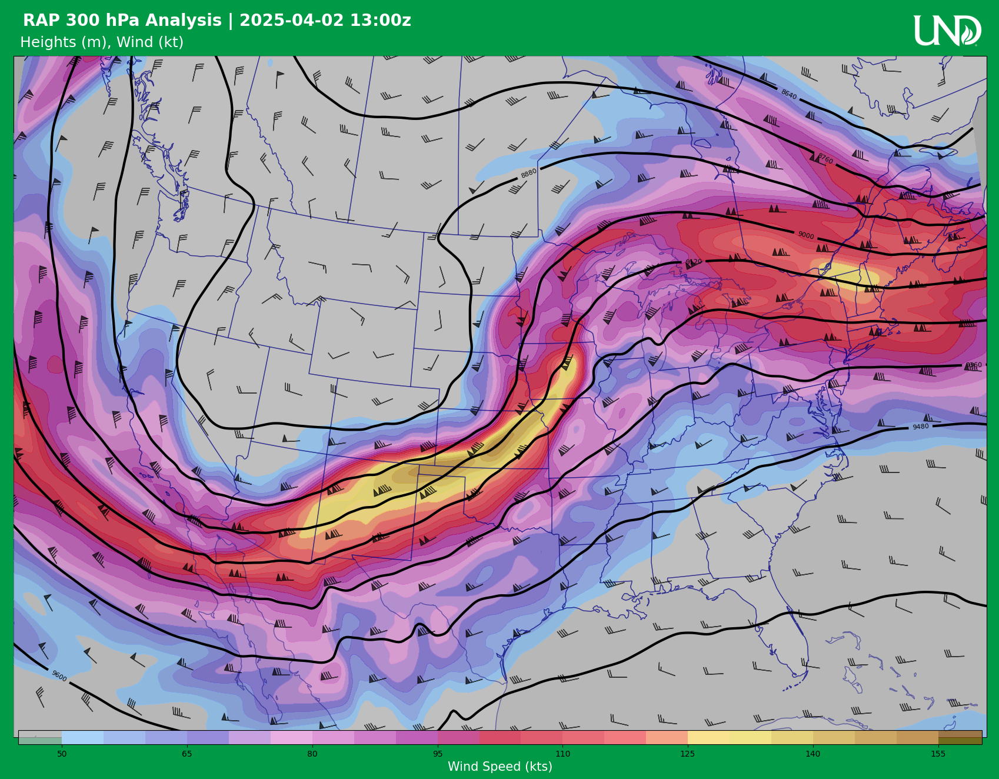

In [9]:
fig, ax = build_map()


#################################
# SLICE THE DATA
#################################
plev300 = np.where(pres_levs == 300)[0][0]

# extract 300hPa geopotential height, u-wind, and v-wind
ghgt_300 = ghgt_iso[plev300]
uwnd_300 = uwnd_iso[plev300]
vwnd_300 = vwnd_iso[plev300]

# compute the 300 hPa wind speed with the u & v components of the 300 hPa wind
wdsp_300 = np.sqrt(uwnd_300**2 + vwnd_300**2)



#################################
# PLOT DATA ON THE MAP
#################################
# basic contour
contour = ax.contour(lons, lats, ghgt_300, np.arange(0, 12000, 120),
                colors='black', linewidths=3.0, linestyles='-',
                transform=ccrs.PlateCarree(), zorder=11)
plt.clabel(contour, fontsize=8, inline=1, inline_spacing=10, fmt='%i',
           rightside_up=True, use_clabeltext=True)


# filled contour
contourf = ax.contourf(lons, lats, wdsp_300, np.arange(50, 160, 5), extend='both',
                 cmap=wdsp_cmap, alpha=0.7, transform=ccrs.PlateCarree(), zorder=4)


# wind barbs
every = 20
barbs = ax.barbs(lons.values[0::every, 0::every], lats.values[0::every, 0::every],
                uwnd_300[0::every, 0::every], vwnd_300[0::every, 0::every],
                length=6.5, alpha=0.7, transform=ccrs.PlateCarree(), zorder=12)


#################################
# ADD MAP EXTRAS
#################################
# plot title, add one to the left with model name and data names, add another to the right with time info
plt.figtext(0.08, 1.03, f'   RAP 300 hPa {data_type} | {valid_date[0:10]} {valid_date[11:-13]}z', weight='bold', ha='left', fontsize=20, color='white')
plt.figtext(0.08, 1.00, f'   Heights (m), Wind (kt)', ha='left', fontsize=18, color='white')
plt.figtext(0.915, 1.04, f' ', ha='left', fontsize=20)
# colorbar for filled contour
cbar = plt.colorbar(contourf, aspect=70, fraction=0.02, ax=ax, orientation='horizontal', pad=-0.01, extendrect=True)
cbar.set_label('Wind Speed (kts)', fontsize=15, color='white')

# add UND logo
from PIL import Image
img = Image.open('und-logo.png')
#                  side-side  up-down  size   size
imgax = fig.add_axes([0.85, 1, 0.06, 0.06], anchor='SE', zorder=3)
imgax.imshow(img)
imgax.axis('off')

C:\Users\kyle.gillett\OneDrive\SCRIPTS\wx-tools\.venv\Lib\site-packages\cartopy\mpl\feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


(np.float64(-0.5), np.float64(929.5), np.float64(424.5), np.float64(-0.5))

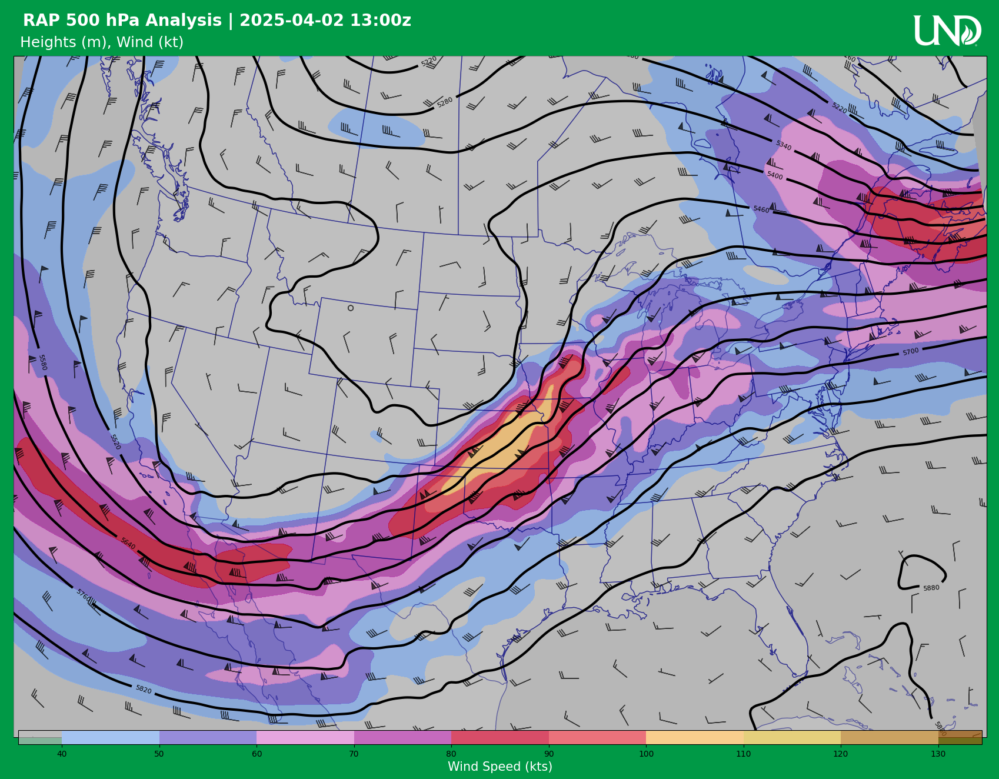

In [10]:
fig, ax = build_map()


#################################
# SLICE THE DATA
#################################
plev500 = np.where(pres_levs == 500)[0][0]

# extract 300hPa geopotential height, u-wind, and v-wind
ghgt_500 = ghgt_iso[plev500]
uwnd_500 = uwnd_iso[plev500]
vwnd_500 = vwnd_iso[plev500]

# compute the 300 hPa wind speed with the u & v components of the 300 hPa wind
wdsp_500 = np.sqrt(uwnd_500**2 + vwnd_500**2)



#################################
# PLOT DATA ON THE MAP
#################################
# basic contour
contour = ax.contour(lons, lats, ghgt_500, np.arange(3000, 7000, 60),
                colors='black', linewidths=3.0, linestyles='-',
                transform=ccrs.PlateCarree(), zorder=11)
plt.clabel(contour, fontsize=8, inline=1, inline_spacing=10, fmt='%i',
           rightside_up=True, use_clabeltext=True)


# filled contour
contourf = ax.contourf(lons, lats, wdsp_500, np.arange(40, 140, 10), extend='both',
                 cmap=wdsp_cmap, alpha=0.7, transform=ccrs.PlateCarree(), zorder=4)


# wind barbs
every = 20
barbs = ax.barbs(lons.values[0::every, 0::every], lats.values[0::every, 0::every],
                uwnd_500[0::every, 0::every], vwnd_500[0::every, 0::every],
                length=6.5, alpha=0.7, transform=ccrs.PlateCarree(), zorder=12)


#################################
# ADD MAP EXTRAS
#################################
# plot title, add one to the left with model name and data names, add another to the right with time info
plt.figtext(0.08, 1.03, f'   RAP 500 hPa {data_type} | {valid_date[0:10]} {valid_date[11:-13]}z', weight='bold', ha='left', fontsize=20, color='white')
plt.figtext(0.08, 1.00, f'   Heights (m), Wind (kt)', ha='left', fontsize=18, color='white')
plt.figtext(0.915, 1.04, f' ', ha='left', fontsize=20)
# colorbar for filled contour
cbar = plt.colorbar(contourf, aspect=70, fraction=0.02, ax=ax, orientation='horizontal', pad=-0.01, extendrect=True)
cbar.set_label('Wind Speed (kts)', fontsize=15, color='white')

# add UND logo
from PIL import Image
img = Image.open('und-logo.png')
#                  side-side  up-down  size   size
imgax = fig.add_axes([0.85, 1, 0.06, 0.06], anchor='SE', zorder=3)
imgax.imshow(img)
imgax.axis('off')

C:\Users\kyle.gillett\OneDrive\SCRIPTS\wx-tools\.venv\Lib\site-packages\cartopy\mpl\feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
C:\Users\kyle.gillett\AppData\Local\Temp\ipykernel_11992\3079437453.py:19: UserWarning: Argument longitude given as xarray Variable...casting to its data. xarray DataArrays are recommended instead.
  dx, dy = mpcalc.lat_lon_grid_deltas(lons, lats)
C:\Users\kyle.gillett\AppData\Local\Temp\ipykernel_11992\3079437453.py:19: UserWarning: Argument latitude given as xarray Variable...casting to its data. xarray DataArrays are recommended instead.
  dx, dy = mpcalc.lat_lon_grid_deltas(lons, lats)
C:\Users\kyle.gillett\AppData\Local\Temp\ipykernel_11992\3079437453.py:20: UserWarning: Argument latitude given as xarray Variable...casting to its data. xarray DataArrays are recommended instead.
  f = mpcalc.coriolis_parameter(np.deg2rad(lats)).to('1/s')

(np.float64(-0.5), np.float64(929.5), np.float64(424.5), np.float64(-0.5))

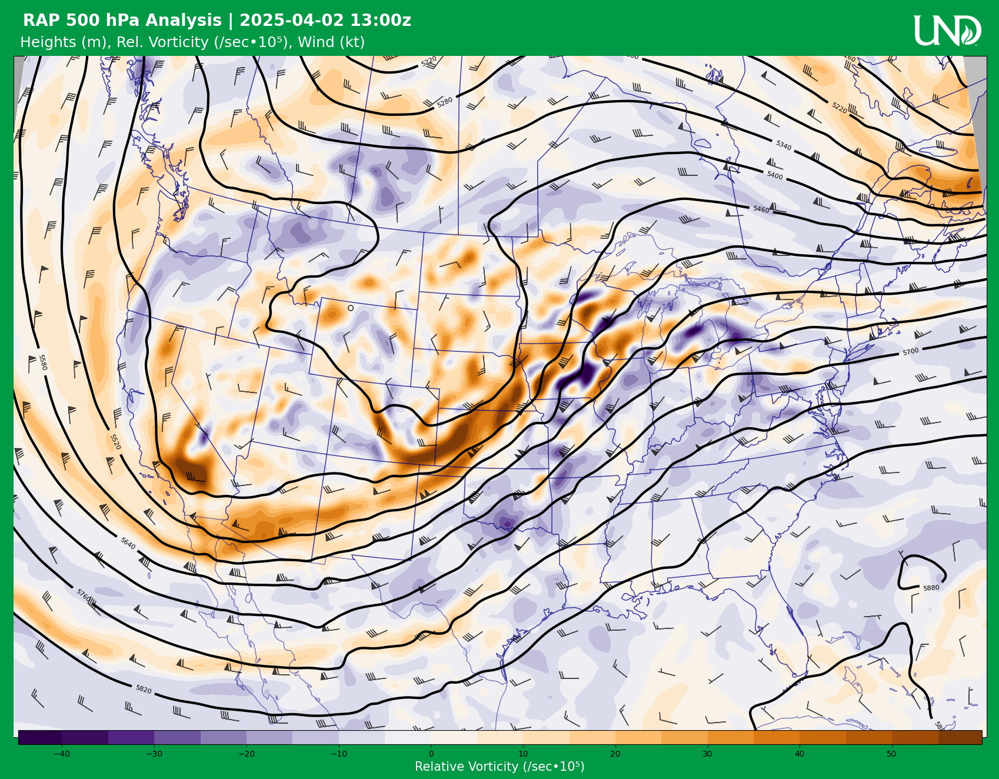

In [11]:
fig, ax = build_map()


#################################
# SLICE THE DATA
#################################
plev500 = np.where(pres_levs == 500)[0][0]

ghgt_500 = ghgt_iso[plev500]
uwnd_500 = uwnd_iso[plev500]
vwnd_500 = vwnd_iso[plev500]

wdsp_500 = np.sqrt(uwnd_500**2 + vwnd_500**2)

xr_uwnd_500 = raw_data.variables['u-component_of_wind_isobaric'][0]
#################################
# CALCULATE VORTICITY
#################################
dx, dy = mpcalc.lat_lon_grid_deltas(lons, lats)
f = mpcalc.coriolis_parameter(np.deg2rad(lats)).to('1/s')
vor_500 = mpcalc.vorticity(uwnd_500*units.kts, vwnd_500*units.kts, dx=dx, dy=dy)
avor_500 = vor_500 + f
f_adv = mpcalc.advection(f, uwnd_500, vwnd_500, dx=dx, dy=dy)
relvort_adv = mpcalc.advection(vor_500, uwnd_500, vwnd_500, dx=dx, dy=dy)
absvort_adv = mpcalc.advection(avor_500, uwnd_500, vwnd_500, dx=dx, dy=dy)



#################################
# 500 hPa GEOPOTENIAL HGT
#################################
# basic contour
contour = ax.contour(lons, lats, ghgt_500, np.arange(3000, 7000, 60),
                colors='black', linewidths=3.0, linestyles='-',
                transform=ccrs.PlateCarree(), zorder=11)
plt.clabel(contour, fontsize=8, inline=1, inline_spacing=10, fmt='%i',
           rightside_up=True, use_clabeltext=True)



#################################
# 500 hPa ABS VORT
#################################
avor_500 = np.where((vor_500.m * 10**5 > -5) & (vor_500.m * 10**5 < 15), np.nan, vor_500)
norm = mcolors.TwoSlopeNorm(vmin=-40, vcenter=0, vmax=60)
all_absvort_cf = ax.contourf(lons, lats, vor_500 * 10**5, np.arange(-40, 60, 5), 
                             norm=norm, extend='both', cmap='PuOr_r', zorder=5, alpha=1, transform=ccrs.PlateCarree())



#################################
# 500 hPa WIND BARBS
#################################
every = 20
barbs = ax.barbs(lons.values[0::every, 0::every], lats.values[0::every, 0::every],
                uwnd_500[0::every, 0::every], vwnd_500[0::every, 0::every],
                length=6.5, alpha=0.7, transform=ccrs.PlateCarree(), zorder=12)


#################################
# ADD MAP EXTRAS
#################################
# plot title, add one to the left with model name and data names, add another to the right with time info
plt.figtext(0.08, 1.03, f'   RAP 500 hPa {data_type} | {valid_date[0:10]} {valid_date[11:-13]}z', weight='bold', ha='left', fontsize=20, color='white')
plt.figtext(0.08, 1.00, f'   Heights (m), Rel. Vorticity (/sec•10⁵), Wind (kt)', ha='left', fontsize=18, color='white')
plt.figtext(0.915, 1.04, f' ', ha='left', fontsize=20)
# colorbar for filled contour
cbar = plt.colorbar(all_absvort_cf, aspect=70, fraction=0.02, ax=ax, orientation='horizontal', pad=-0.01, extendrect=True)
cbar.set_label('Relative Vorticity (/sec•10⁵)', fontsize=15, color='white')

# add UND logo
from PIL import Image
img = Image.open('und-logo.png')
#                  side-side  up-down  size   size
imgax = fig.add_axes([0.85, 1, 0.06, 0.06], anchor='SE', zorder=3)
imgax.imshow(img)
imgax.axis('off')

C:\Users\kyle.gillett\OneDrive\SCRIPTS\wx-tools\.venv\Lib\site-packages\cartopy\mpl\feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
C:\Users\kyle.gillett\AppData\Local\Temp\ipykernel_11992\155508529.py:19: UserWarning: Argument longitude given as xarray Variable...casting to its data. xarray DataArrays are recommended instead.
  dx, dy = mpcalc.lat_lon_grid_deltas(lons, lats)
C:\Users\kyle.gillett\AppData\Local\Temp\ipykernel_11992\155508529.py:19: UserWarning: Argument latitude given as xarray Variable...casting to its data. xarray DataArrays are recommended instead.
  dx, dy = mpcalc.lat_lon_grid_deltas(lons, lats)
C:\Users\kyle.gillett\AppData\Local\Temp\ipykernel_11992\155508529.py:20: UserWarning: Argument latitude given as xarray Variable...casting to its data. xarray DataArrays are recommended instead.
  f = mpcalc.coriolis_parameter(np.deg2rad(lats)).to('1/s')


(np.float64(-0.5), np.float64(929.5), np.float64(424.5), np.float64(-0.5))

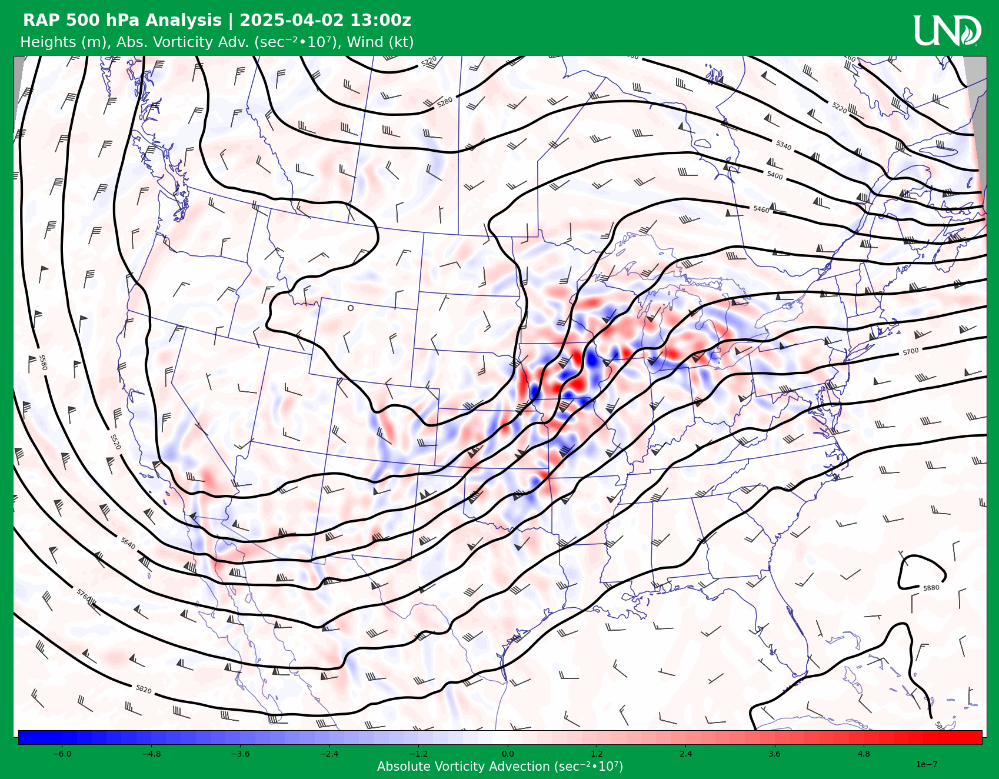

In [12]:
fig, ax = build_map()


#################################
# SLICE THE DATA
#################################
plev500 = np.where(pres_levs == 500)[0][0]

ghgt_500 = ghgt_iso[plev500]
uwnd_500 = uwnd_iso[plev500]
vwnd_500 = vwnd_iso[plev500]

wdsp_500 = np.sqrt(uwnd_500**2 + vwnd_500**2)


#################################
# CALCULATE VORTICITY
#################################
dx, dy = mpcalc.lat_lon_grid_deltas(lons, lats)
f = mpcalc.coriolis_parameter(np.deg2rad(lats)).to('1/s')
vor_500 = mpcalc.vorticity(uwnd_500*units.kts, vwnd_500*units.kts, dx=dx, dy=dy)
avor_500 = vor_500 + f
f_adv = mpcalc.advection(f, uwnd_500, vwnd_500, dx=dx, dy=dy)
relvort_adv = mpcalc.advection(vor_500, uwnd_500, vwnd_500, dx=dx, dy=dy)
absvort_adv = mpcalc.advection(avor_500, uwnd_500, vwnd_500, dx=dx, dy=dy)


#################################
# 500 hPa GEOPOTENIAL HGT
#################################
# basic contour
contour = ax.contour(lons, lats, ghgt_500, np.arange(3000, 7000, 60),
                colors='black', linewidths=3.0, linestyles='-',
                transform=ccrs.PlateCarree(), zorder=11)
plt.clabel(contour, fontsize=8, inline=1, inline_spacing=10, fmt='%i',
           rightside_up=True, use_clabeltext=True)



#################################
# 500 hPa ABS VORT
#################################

all_absvort_cf = ax.contourf(lons, lats, absvort_adv, np.arange(-6*10**-7, 6*10**-7, 2*10**-8),
                             extend='both', cmap='bwr', zorder=5, alpha=1, transform=ccrs.PlateCarree())



#################################
# 500 hPa WIND BARBS
#################################
every = 20
barbs = ax.barbs(lons.values[0::every, 0::every], lats.values[0::every, 0::every],
                uwnd_500[0::every, 0::every], vwnd_500[0::every, 0::every],
                length=6.5, alpha=0.7, transform=ccrs.PlateCarree(), zorder=12)


#################################
# ADD MAP EXTRAS
#################################
# plot title, add one to the left with model name and data names, add another to the right with time info
plt.figtext(0.08, 1.03, f'   RAP 500 hPa {data_type} | {valid_date[0:10]} {valid_date[11:-13]}z', weight='bold', ha='left', fontsize=20, color='white')
plt.figtext(0.08, 1.00, f'   Heights (m), Abs. Vorticity Adv. (sec⁻²•10⁷), Wind (kt)', ha='left', fontsize=18, color='white')
plt.figtext(0.915, 1.04, f' ', ha='left', fontsize=20)
# colorbar for filled contour
cbar = plt.colorbar(all_absvort_cf, aspect=70, fraction=0.02, ax=ax, orientation='horizontal', pad=-0.01, extendrect=True)
cbar.set_label('Absolute Vorticity Advection (sec⁻²•10⁷)', fontsize=15, color='white')

# add UND logo
from PIL import Image
img = Image.open('und-logo.png')
#                  side-side  up-down  size   size
imgax = fig.add_axes([0.85, 1, 0.06, 0.06], anchor='SE', zorder=3)
imgax.imshow(img)
imgax.axis('off')

C:\Users\kyle.gillett\OneDrive\SCRIPTS\wx-tools\.venv\Lib\site-packages\cartopy\mpl\feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


(np.float64(-0.5), np.float64(929.5), np.float64(424.5), np.float64(-0.5))

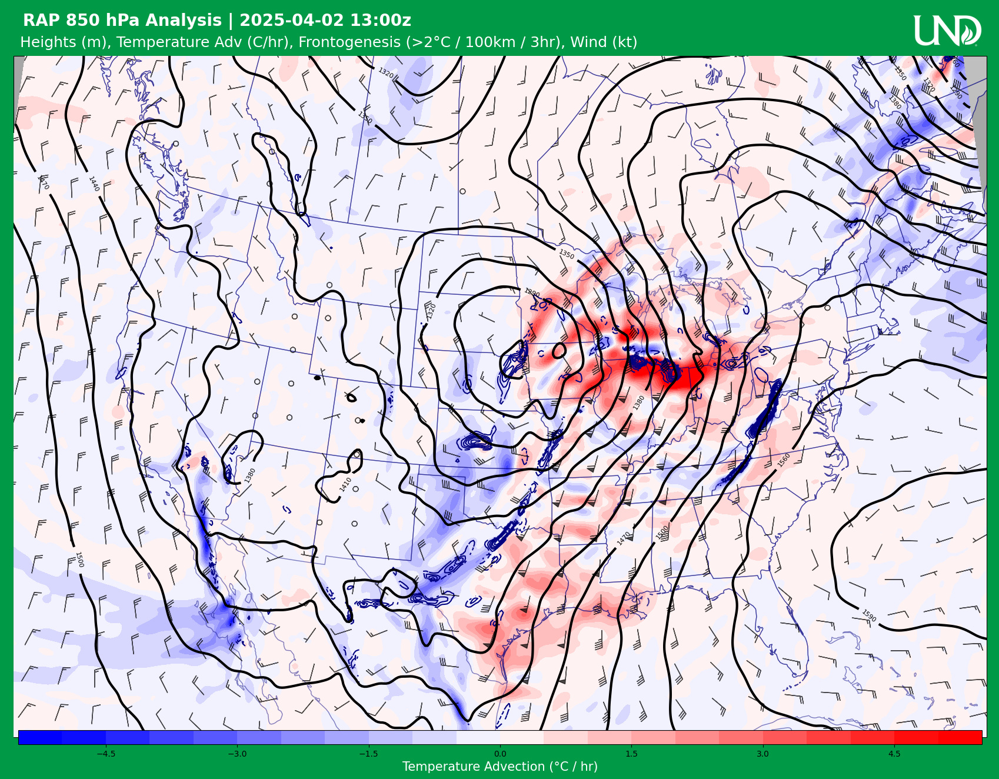

In [13]:
fig, ax = build_map()


#################################
# SLICE THE DATA
#################################
plev850 = np.where(pres_levs == 850)[0][0]

ghgt_850 = ghgt_iso[plev850]
uwnd_850 = uwnd_iso[plev850]
vwnd_850 = vwnd_iso[plev850]
temp_850 = temp_iso[plev850]

wdsp_850 = np.sqrt(uwnd_850**2 + vwnd_850**2)



#################################
# GEOPOTENIAL HGT
#################################
# basic contour
contour = ax.contour(lons, lats, ghgt_850, np.arange(0, 1700, 30),
                colors='black', linewidths=3.0, linestyles='-',
                transform=ccrs.PlateCarree(), zorder=11)
plt.clabel(contour, fontsize=8, inline=1, inline_spacing=10, fmt='%i',
           rightside_up=True, use_clabeltext=True)

# plot tadv
tadv_contourf = ax.contourf(raw_data['lon'], raw_data['lat'], adv[0,plev850,:,:],
                np.arange(-5,5.25,0.50), cmap='bwr', transform=ccrs.PlateCarree(), zorder=4, extend='both')

# plot filled contours pf frontogenesis > 2 delta deg C / hr
fgen_contourf = ax.contour(raw_data['lon'], raw_data['lat'], fgen_masked[0,plev850,:,:], 
                           np.arange(1, 32, 2), colors='navy', linestyles='-',
                           transform=ccrs.PlateCarree(), zorder=4)


#################################
# WIND BARBS
#################################
every = 15
barbs = ax.barbs(lons.values[0::every, 0::every], lats.values[0::every, 0::every],
                uwnd_850[0::every, 0::every], vwnd_850[0::every, 0::every],
                length=6.5, alpha=0.7, transform=ccrs.PlateCarree(), zorder=11)


#################################
# ADD MAP EXTRAS
#################################
# plot title, add one to the left with model name and data names, add another to the right with time info
plt.figtext(0.08, 1.03, f'   RAP 850 hPa {data_type} | {valid_date[0:10]} {valid_date[11:-13]}z', weight='bold', ha='left', fontsize=20, color='white')
plt.figtext(0.08, 1.00, f'   Heights (m), Temperature Adv (C/hr), Frontogenesis (>2'+u'\xb0'+'C / 100km / 3hr), Wind (kt)', ha='left', fontsize=18, color='white')
plt.figtext(0.915, 1.04, f' ', ha='left', fontsize=20)
# colorbar for filled contour
cbar = plt.colorbar(tadv_contourf, aspect=70, fraction=0.02, ax=ax, orientation='horizontal', pad=-0.01, extendrect=True)
cbar.set_label('Temperature Advection' + ' ('+u'\xb0'+'C / hr)', fontsize=15, color='white')

# add UND logo
from PIL import Image
img = Image.open('und-logo.png')
#                  side-side  up-down  size   size
imgax = fig.add_axes([0.85, 1, 0.06, 0.06], anchor='SE', zorder=3)
imgax.imshow(img)
imgax.axis('off')

C:\Users\kyle.gillett\OneDrive\SCRIPTS\wx-tools\.venv\Lib\site-packages\cartopy\mpl\feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
C:\Users\kyle.gillett\AppData\Local\Temp\ipykernel_11992\804436288.py:54: UserWarning: Adding colorbar to a different Figure <Figure size 2000x1200 with 3 Axes> than <Figure size 2000x1200 with 2 Axes> which fig.colorbar is called on.
  cbar = plt.colorbar(tadv_contourf, aspect=70, fraction=0.02, ax=ax, orientation='horizontal', pad=-0.01, extendrect=True)


(np.float64(-0.5), np.float64(929.5), np.float64(424.5), np.float64(-0.5))

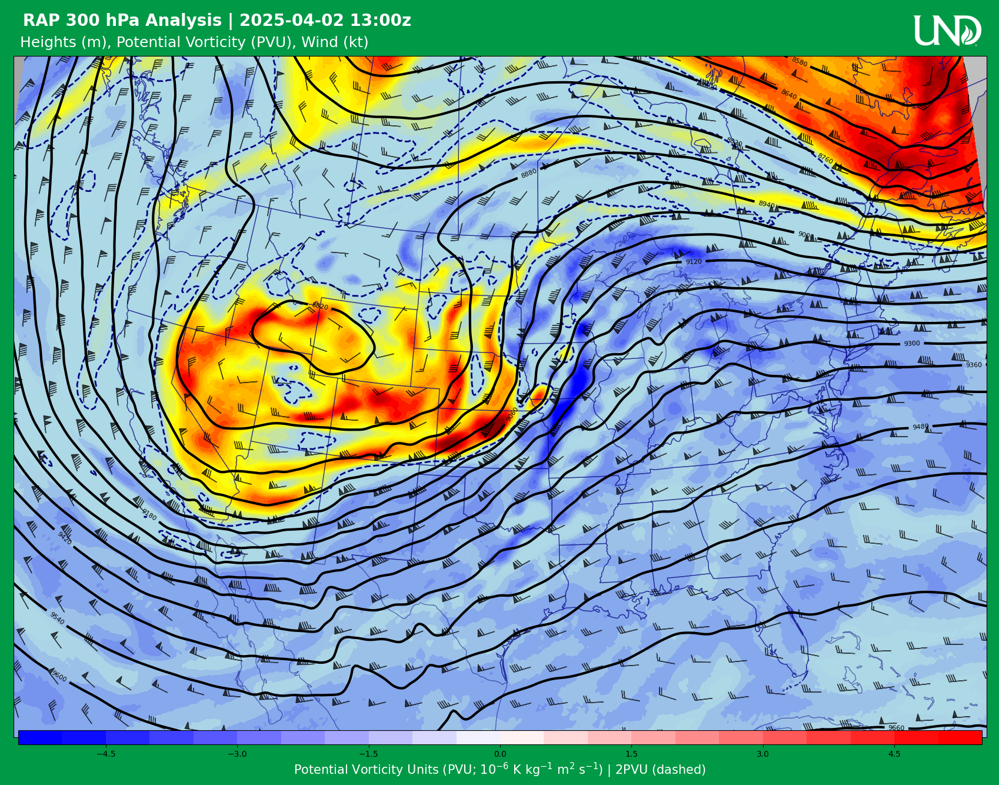

In [14]:
fig, ax = build_map()


#################################
# SLICE THE DATA
#################################
plev300 = np.where(pres_levs == 300)[0][0]

ghgt_300 = ghgt_iso[plev300]
uwnd_300 = uwnd_iso[plev300]
vwnd_300 = vwnd_iso[plev300]
temp_300 = temp_iso[plev300]

wdsp_300 = np.sqrt(uwnd_300**2 + vwnd_300**2)



#################################
# GEOPOTENIAL HGT
#################################
# basic contour
contour = ax.contour(lons, lats, ghgt_300, np.arange(0, 12000, 60),
                colors='black', linewidths=3.0, linestyles='-',
                transform=ccrs.PlateCarree(), zorder=11)
plt.clabel(contour, fontsize=8, inline=1, inline_spacing=10, fmt='%i',
           rightside_up=True, use_clabeltext=True)

contourf = ax.contourf(raw_data['lon'], raw_data['lat'], raw_data['pv'][plev300,0,:,:]*1e6, pv_clevs, cmap=pv_cmap,
                 transform=ccrs.PlateCarree(),extend='both')

# plot a single dashed contour @ 2PVU
pv_contour = ax.contour(raw_data['lon'], raw_data['lat'], raw_data['pv'][plev300,0,:,:]*1e6, [2], colors='navy',linestyles='dashed',linewidths=2,
                 transform=ccrs.PlateCarree())



#################################
# WIND BARBS
#################################
every = 15
barbs = ax.barbs(lons.values[0::every, 0::every], lats.values[0::every, 0::every],
                uwnd_300[0::every, 0::every], vwnd_300[0::every, 0::every],
                length=6.5, alpha=0.7, transform=ccrs.PlateCarree(), zorder=11)


#################################
# ADD MAP EXTRAS
#################################
# plot title, add one to the left with model name and data names, add another to the right with time info
plt.figtext(0.08, 1.03, f'   RAP 300 hPa {data_type} | {valid_date[0:10]} {valid_date[11:-13]}z', weight='bold', ha='left', fontsize=20, color='white')
plt.figtext(0.08, 1.00, f'   Heights (m), Potential Vorticity (PVU), Wind (kt)', ha='left', fontsize=18, color='white')
plt.figtext(0.915, 1.04, f' ', ha='left', fontsize=20)
# colorbar for filled contour
cbar = plt.colorbar(tadv_contourf, aspect=70, fraction=0.02, ax=ax, orientation='horizontal', pad=-0.01, extendrect=True)
cbar.set_label(r'Potential Vorticity Units (PVU; $\rm{10^{-6}\ K\ kg^{-1}\ m^{2}\ s^{-1}})$' + ' | 2PVU (dashed)', fontsize=15, color='white')

# add UND logo
from PIL import Image
img = Image.open('und-logo.png')
#                  side-side  up-down  size   size
imgax = fig.add_axes([0.85, 1, 0.06, 0.06], anchor='SE', zorder=3)
imgax.imshow(img)
imgax.axis('off')

C:\Users\kyle.gillett\OneDrive\SCRIPTS\wx-tools\.venv\Lib\site-packages\cartopy\mpl\feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


(np.float64(-0.5), np.float64(929.5), np.float64(424.5), np.float64(-0.5))

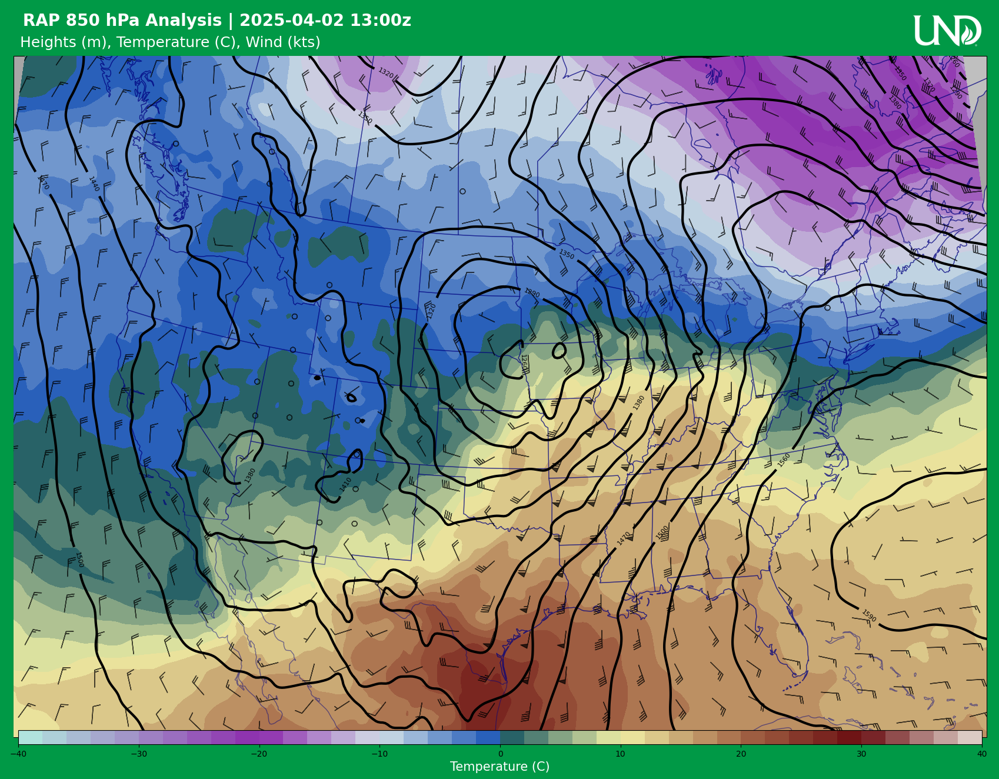

In [15]:
fig, ax = build_map()


#################################
# SLICE THE DATA
#################################
plev850 = np.where(pres_levs == 850)[0][0]

ghgt_850 = ghgt_iso[plev850]
uwnd_850 = uwnd_iso[plev850]
vwnd_850 = vwnd_iso[plev850]
temp_850 = temp_iso[plev850]

wdsp_850 = np.sqrt(uwnd_850**2 + vwnd_850**2)



#################################
# GEOPOTENIAL HGT
#################################
# basic contour
contour = ax.contour(lons, lats, ghgt_850, np.arange(0, 1700, 30),
                colors='black', linewidths=3.0, linestyles='-',
                transform=ccrs.PlateCarree(), zorder=11)
plt.clabel(contour, fontsize=8, inline=1, inline_spacing=10, fmt='%i',
           rightside_up=True, use_clabeltext=True)

# contour = ax.contour(lons, lats, wdsp_850, np.arange(25, 100, 10),
#                 cmap='jet', linewidths=3.0, linestyles='--',
#                 transform=ccrs.PlateCarree(), zorder=5)


# 
# contour_fill = ax.contourf(lons, lats, wdsp_850, np.arange(25, 100, 10),
#                             cmap='jet', alpha=0.3, transform=ccrs.PlateCarree(), zorder=4)
# 
# contours = ax.contour(lons, lats, wdsp_850, np.arange(25, 100, 10),
#                       cmap='jet', linewidths=2.0, linestyles='--',
#                       transform=ccrs.PlateCarree(), zorder=5)
# 
# # Add hatching to the contour lines
# for c in contours.collections:
#     c.set_hatch('\\')
#     c.set_linewidth(0.25)
#     c.set_alpha(0.25)
    
    
#################################
# 500 hPa GEOPOTENIAL HGT
#################################
# contourf = ax.contourf(lons, lats, wdsp_850, np.arange(25, 100, 5),
#                  cmap='BuPu', alpha=0.7, transform=ccrs.PlateCarree(), zorder=4)
contourf = ax.contourf(lons, lats, temp_850, np.arange(-40, 42, 2), extent='both',
                 cmap=temp_cmap, alpha=1, transform=ccrs.PlateCarree(), zorder=4)


#################################
# WIND BARBS
#################################
every = 15
barbs = ax.barbs(lons.values[0::every, 0::every], lats.values[0::every, 0::every],
                uwnd_850[0::every, 0::every], vwnd_850[0::every, 0::every],
                length=6.5, alpha=0.7, transform=ccrs.PlateCarree(), zorder=11)


#################################
# ADD MAP EXTRAS
#################################
# plot title, add one to the left with model name and data names, add another to the right with time info
plt.figtext(0.08, 1.03, f'   RAP 850 hPa {data_type} | {valid_date[0:10]} {valid_date[11:-13]}z', weight='bold', ha='left', fontsize=20, color='white')
plt.figtext(0.08, 1.00, f'   Heights (m), Temperature (C), Wind (kts)', ha='left', fontsize=18, color='white')
plt.figtext(0.915, 1.04, f' ', ha='left', fontsize=20)
# colorbar for filled contour
cbar = plt.colorbar(contourf, aspect=70, fraction=0.02, ax=ax, orientation='horizontal', pad=-0.01, extendrect=True)
cbar.set_label('Temperature (C)', fontsize=15, color='white')


from PIL import Image
img = Image.open('und-logo.png')
#                  side-side  up-down  size   size
imgax = fig.add_axes([0.85, 1, 0.06, 0.06], anchor='SE', zorder=3)
imgax.imshow(img)
imgax.axis('off')

In [16]:
radar_data, radar_lat, radar_lon, radar_time = get_latest_mosaic('2025', '04', '01')

metar_obs, metar_time = get_metar_data(reduced_to=120000)

# import psutil
# 
# def close_file(file_path):
#     for proc in psutil.process_iter():
#         try:
#             for item in proc.open_files():
#                 if file_path in item.path:
#                     proc.kill()  # Force close the process
#         except Exception as e:
#             pass  # Ignore processes that don't allow access
# 
# close_file("../observations-data/goes_data.nc")
# os.remove("../observations-data/goes_data.nc")
# if os.path.exists("../observations-data/goes_data.nc"):
#     os.remove("../observations-data/goes_data.nc")  

download_goes_file("2025","091","16","../observations-data/goes_data.nc")

xrds = xr.open_dataset('../observations-data/goes_data.nc')
radiance = xrds.variables['Rad'][:]

# Set time variables
scan_start = datetime.datetime.strptime(xrds.time_coverage_start, '%Y-%m-%dT%H:%M:%S.%fZ')
sat_time = scan_start.strftime('%H%M%S')

data = xrds.metpy.parse_cf('Rad')
data_crs = data.metpy.cartopy_crs
data_xcord = data.x
data_ycord = data.y

globe = ccrs.Globe(semimajor_axis=xrds['goes_imager_projection'].semi_major_axis, 
                   semiminor_axis=xrds['goes_imager_projection'].semi_minor_axis)

crs = ccrs.Geostationary(central_longitude=xrds['goes_imager_projection'].longitude_of_projection_origin, 
                         satellite_height=xrds['goes_imager_projection'].perspective_point_height,
                         globe=globe)
proj = ccrs.LambertConformal(globe=globe)
xrds.close()


METAR DATA RETRIEVAL COMPLETE


PermissionError: [Errno 13] Permission denied

C:\Users\kyle.gillett\OneDrive\SCRIPTS\wx-tools\.venv\Lib\site-packages\cartopy\mpl\feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


(np.float64(-0.5), np.float64(929.5), np.float64(424.5), np.float64(-0.5))

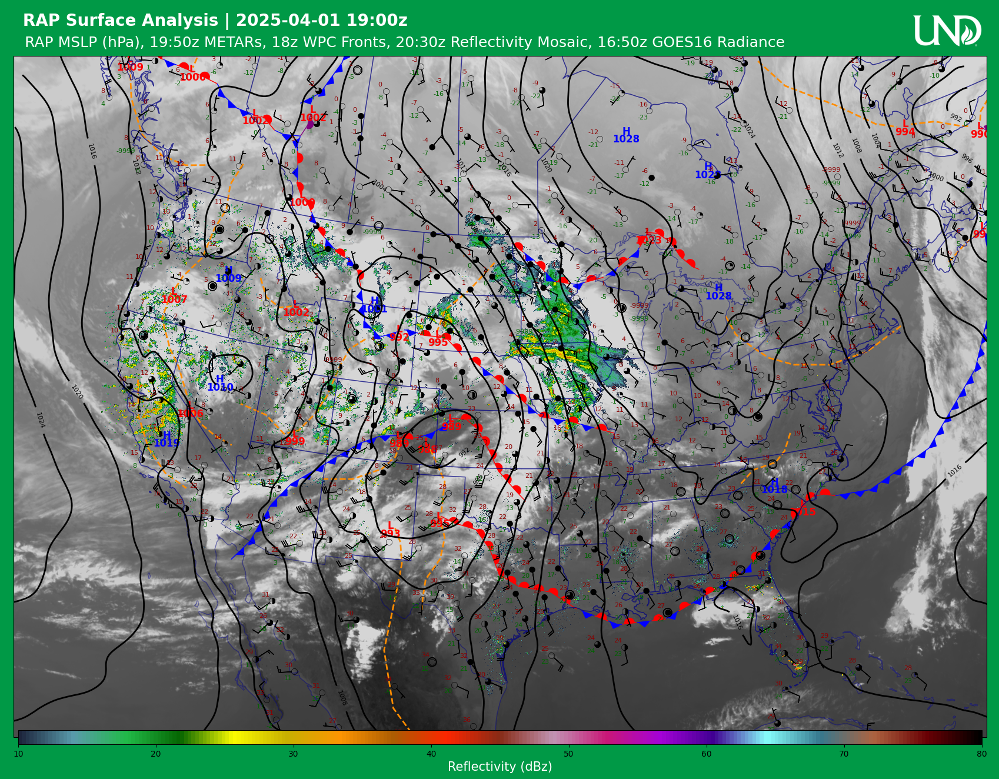

In [24]:
fig, ax = build_map(style='dark')

from metpy.plots import USCOUNTIES
#ax.add_feature(USCOUNTIES.with_scale('20m'), alpha=0.1, edgecolor='white', linestyle='-', lw=0.5, zorder=12.1)




###################################################################
# METAR STATION PLOTS
###################################################################
from metpy.plots import StationPlot, StationPlotLayout, sky_cover
custom_layout = StationPlotLayout()
custom_layout.add_barb('eastward_wind', 'northward_wind', units='knots')
custom_layout.add_value('NW', 'air_temperature', fmt='.0f', units='degF', color='darkred')
#custom_layout.add_value('NE', 'sea_level_pressure', fmt='.0f', units='mb', color='black')
custom_layout.add_value('SW', 'dew_point_temperature', fmt='.0f', units='degF', color='darkgreen')
custom_layout.add_symbol('C', 'cloud_coverage', sky_cover)
stationplot = StationPlot(ax, metar_obs['longitude'], metar_obs['latitude'], clip_on=True,
                          transform=ccrs.PlateCarree(), fontsize=8, zorder=12, alpha=1)
custom_layout.plot(stationplot, metar_obs)


###################################################################
# RAP MSLP
###################################################################
cs = ax.contour(lons, lats, pres_sfc/100, np.arange(904, 1054, 4), colors='black', 
                linewidths=2.0, linestyles='-',
                transform=ccrs.PlateCarree(), zorder=11)
plt.clabel(cs, fontsize=8, inline=1, inline_spacing=10, fmt='%i',
           rightside_up=True, use_clabeltext=True)


###################################################################
# RADAR MOSAIC  
###################################################################
pm = ax.pcolormesh(radar_lon+0.05, radar_lat+0.05, radar_data,
              vmin=10, vmax=80, cmap=rs_cmap, alpha=1, zorder=1.3, transform=ccrs.PlateCarree())

###################################################################
# LATEST FRONTS BULLETIN  
###################################################################
texts, params, geoms, valid_time = mdf.plot_bulletin(ax)




###################################################################
# SATELLITE DATA 
###################################################################
ax.imshow(radiance.values, origin='upper', cmap=ir_greys, vmin=50, vmax=130,
           extent=(data_xcord.values.min(), data_xcord.values.max(), data_ycord.values.min(), data_ycord.values.max()),
           regrid_shape=2000,
           aspect='auto',
           interpolation='gaussian',
           transform=crs, 
           alpha=0.8, zorder=1)



#################################
# ADD MAP EXTRAS
#################################
# plot title, add one to the left with model name and data names, add another to the right with time info
plt.figtext(0.08, 1.03, f'   RAP Surface Analysis | {valid_date[0:10]} {valid_date[11:-13]}z', weight='bold', ha='left', fontsize=20, color='white')
plt.figtext(0.08, 1.00, f'    RAP MSLP (hPa), {metar_time[11:16]}z METARs, {valid_time}z WPC Fronts, {str(radar_time)[11:16]}z Reflectivity Mosaic, {sat_time[0:2]}:{sat_time[2:4]}z GOES16 Radiance', ha='left', fontsize=18, color='white')
plt.figtext(0.915, 1.04, f' ', ha='left', fontsize=20)
# colorbar for filled contour
cbar = plt.colorbar(pm, aspect=70, fraction=0.02, ax=ax, orientation='horizontal', pad=-0.01, extendrect=True)
cbar.set_label('Reflectivity (dBz)', fontsize=15, color='white')


from PIL import Image
img = Image.open('und-logo.png')
#                  side-side  up-down  size   size
imgax = fig.add_axes([0.85, 1, 0.06, 0.06], anchor='SE', zorder=3)
imgax.imshow(img)
imgax.axis('off')

In [19]:
utc_date = datetime.datetime.utcnow()
utc_doy = utc_date.timetuple().tm_yday
if utc_doy < 100:
    utc_doy = f'0{utc_doy}'
else:
    utc_doy = str(utc_doy)
utc_now = [utc_date.strftime("%Y"), utc_date.strftime("%m"), utc_date.strftime("%d"), utc_date.strftime("%H"), utc_doy]

C:\Users\kyle.gillett\AppData\Local\Temp\ipykernel_11992\4237574973.py:1: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  utc_date = datetime.datetime.utcnow()


In [20]:
utc_now

['2025', '04', '02', '16', '092']